<a href="https://colab.research.google.com/github/ShineySun/BASIC_AI/blob/master/%EC%B0%A8%EB%9F%89%EC%A7%80%EB%8A%A5%EA%B8%B0%EC%B4%88_HW5_20143038_%EA%B9%80%EC%84%A0%ED%95%84.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Feature Detection

국민대학교 차량지능기초 SLAM 파트 과제 1

- 학번 : 20143038
- 이름 : 김선필

---

OpenCV를 사용하여 다음과 같은 다양한 feature detection 알고리즘을 사용해본다.

- Harris corner detection
- FAST
- ORB (Oriented FAST and Rotated BRIEF)
- SIFT (Scale-Invariant Feature Transform)
- SURF (Speeded-Up Robust Features)


**참고**

- [OpenCV tutorial - Feature Detection and Description](https://docs.opencv.org/master/db/d27/tutorial_py_table_of_contents_feature2d.html)
- [OpenCV document](https://docs.opencv.org/2.4/modules/imgproc/doc/feature_detection.html)
- [이미지 특징 추출 (데이터 사이언스 스쿨)](https://datascienceschool.net/view-notebook/7eb4b2a440824bb0a8c2c7ce3da7a4e2/)

---

**[중요] 과제 제출 방법**
- 과제 제출 기한은 2020년 6월 5일까지입니다.
- 과제는 Colab에서 작성한 것을 다운받아 (파일-.ipynb 다운로드) 가상 대학에 업로드합니다. (이외의 제출 방법은 인정하지 않음)
- 제출 시 파일 제목은 '학번_이름' 으로 저장합니다.

In [1]:
!pip uninstall opencv-python -y
# downgrade OpenCV a bit since some none-free features are not avilable
!pip install opencv-contrib-python==3.4.2.17 --force-reinstall

Uninstalling opencv-python-4.1.2.30:
  Successfully uninstalled opencv-python-4.1.2.30
     |████████████████████████████████| 30.6MB 143kB/s 
     |████████████████████████████████| 20.1MB 56.4MB/s 
ERROR: imgaug 0.2.9 requires opencv-python, which is not installed.
ERROR: dopamine-rl 1.0.5 requires opencv-python>=3.4.1.15, which is not installed.
ERROR: albumentations 0.1.12 requires opencv-python, which is not installed.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: numpy 1.18.4
    Uninstalling numpy-1.18.4:
      Successfully uninstalled numpy-1.18.4
  Found existing installation: opencv-contrib-python 4.1.2.30
    Uninstalling opencv-contrib-python-4.1.2.30:
      Successfully uninstalled opencv-contrib-python-4.1.2.30


In [2]:
# 관련 패키지 임포트
import sys
# python numpy 패키지 임포트
import numpy as np
# Computer Vision 에 필요한 opencv 패키지 임포트
import cv2 as cv
# matplotlib 임포트 - colab 에서는 cv2.imshow 가 안되기 때문에, 대체로 plt.imshow를 많이 사용.
import matplotlib.pyplot as plt

# print python version
print('python version : ', sys.version)
# print numpy version
print('numpy version : ', np.__version__)
# print opencv version
print('opencv version : ', cv.__version__)

python version :  3.6.9 (default, Apr 18 2020, 01:56:04) 
[GCC 8.4.0]
numpy version :  1.18.4
opencv version :  3.4.2


## Google Drive와 연동하기

구글 드라이브와 colab을 연동하여 드라이브에 있는 파일들을 가져올 수 있게 한다.

- 아래 코드를 실행
- 출력된 링크를 클릭해 구글 계정 로그인 
- 로그인 후 나오는 코드를 복사하여 붙여넣기

[참고: 코랩 사용법 (데이터 사이언스 스쿨)](https://datascienceschool.net/view-notebook/f9d9fddb7cc7494a9e4be99f0e137be0/)


In [3]:
# mount
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


좌측의 파일 아이콘을 선택하거나 아래 명령어를 통해 파일을 확인할 수 있다.

In [4]:
!ls 'drive/My Drive/2020_1학기/차량지능기초/과제5'

feature  차량지능기초_HW5_20143038_김선필


In [0]:
# My root dir path
ROOT = 'drive/My Drive/2020_1학기/차량지능기초/과제5/feature/'

In [6]:
import os

# 현재 폴더 디렉토리에서 파일리스트를 로드한다.
file_lists = os.listdir(ROOT)

# 파일 리스트 출력
print("Image File Lists : ", file_lists)

Image File Lists :  ['story.jpeg', 'DPP_0010.JPG', 'DPP_0011.JPG', 'DPP_0013.JPG', 'chessboard.jpg', 'Lenna.png']


### opencv를 사용해 이미지 불러오기

- `cv.imread()`를 이용해 이미지를 불러오면 RGB가 아닌 BGR 이미지임을 유의해야 한다.

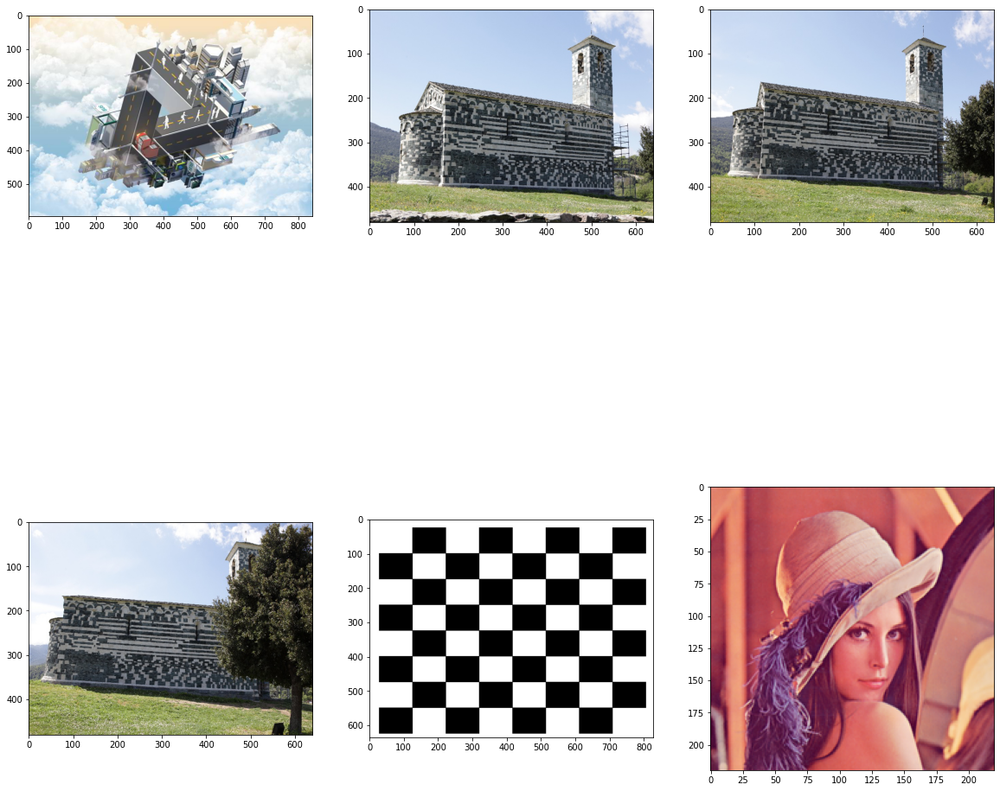

In [7]:
# Figure 생성
fig = plt.figure(figsize=(20, 20))
rows = 2
cols = 3

# Function : img_show - 현재 디렉토리에 존재하는 모든 이미지 파일을 출력한다.
def img_show(img_name, idx):
  global ROOT
  # 현재 디렉토리 폴더에 있는 이미지를 로드한다.
  img = cv.imread( ROOT + img_name)
  
  ax = fig.add_subplot(rows, cols, idx)
  # plt.imshow() 의 경우 이미지가 BGR 순으로 들어오기 때문에
  # RGB 이미지로 Converting 해주는 과정이 필요하다.
  # 두가지 방법이 존재하지만 이 함수에서는 예제 코드에 맞게 두겠다.
  plt.imshow(img[:,:,::-1])

# 파일리스트에 있는 파일을 순차적으로 실행시키는 함수이다.
# file list에는 총 5개의 파일이 존재한다.
def img_show_main():
  global ROOT
  global file_lists
  idx = 1

  for img_name in file_lists:
    img_show(img_name, idx)
    idx += 1
  plt.show()

img_show_main()

## Harris Corner Detection

해리스 코너 추출 함수 `cornerHarris`는 이미지 위에 커널을 이동시키면서 그레디언트의 변화량을 구하고 이 값을 적절한 기준값으로 구별하여 코너점을 찾는다.

**과제**
- 해리스 코너를 찾고, 이를 시각화한다.
- 파라미터를 바꿔가며 실험해본다.
- 제공한 이미지 외에 다른 이미지에도 적용하여 분석해 본다.

관련 함수
`dst	=	cv.cornerHarris(	src, blockSize, ksize, k[, dst[, borderType]]	)` 


### Harris Corner Detection (1988)
### ● 과 정
#### 1. Sobel 마스크를 이용하여 X축, Y축 미분갑을 계산한다.
#### 2. 미분값에 Gaussian Mask를 적용하여 Noise를 제거한다.
#### 3. CRF(코너 응답 함수)를 계산한다.
#### 4. Non-maximum supression을 적용하여 코너 검출.
### ● 장 점
#### 영상의 평행이동, 회전변화에는 불변하며 affine 변화, 조명 변화에도 어느 정도 Robust하다.
### ● 단 점 
#### 하지만 영상의 크기, 즉 Scale 변화에는 영향을 받기 때문에 응용하기 위해서는 여러 영상 스케일에서 특징점을 뽑을 필요가 존재한다.


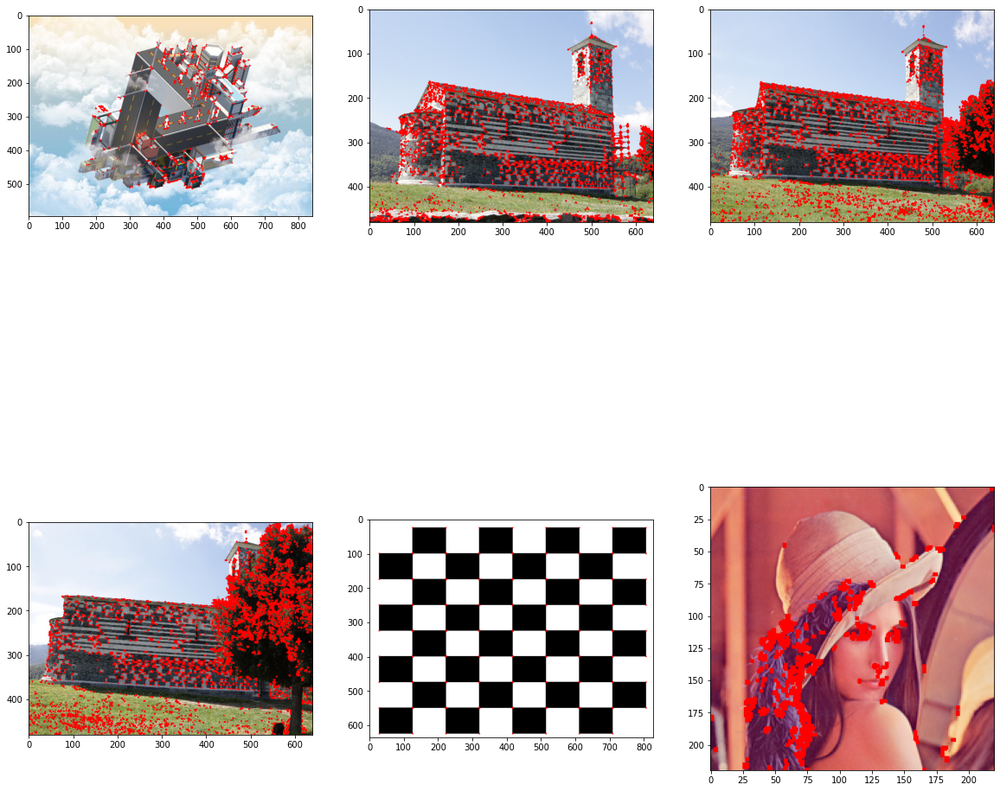

In [11]:
# Figure 생성
fig = plt.figure(figsize=(20, 20))
rows = 2
cols = 3

# Function : Harris_Corner_Detector - Harris Corner Detection 수행
def Harris_Corner_Detcetor(img_name,idx, block_size = 2, s_size = 3):
  global ROOT
  # source image 를 load 한다.
  src_img = cv.imread(ROOT+img_name)
  
  # source image를 gray image 로 convert 한다.
  gray_img = cv.cvtColor(src_img, cv.COLOR_BGR2GRAY)
  
  # To-do
  # Harris Corner Detection 을 수행하기 위해, numpy 의 float32 데이터형으로 변환한다.
  gray_array = np.float32(gray_img)
  
  # cornerHarris() 함수를 이용하여 Harris Corner를 추출한다.
  # dst = cv.cornerHarris( src, blockSize, ksize, k[, dst[, borderType]] )
  # src : 이미지 데이터
  # blockSize : Corner Detection을 위해 고려되는 인접 픽셀 크기
  # ksize : Sobel Derivative의 Aperture 파라미터
  # k : Harris Detector 파라미터
  dst_img = cv.cornerHarris(gray_array, block_size, s_size, 0.04)
  # 감지된 Corner Points를 확장 연산을 통해 표기한다.
  dst_img = cv.dilate(dst_img, None)
  
  # Corner로 표시되는 포인트들을 빨간점으로 표기한다.
  src_img[dst_img>0.01*dst_img.max()]=[0,0,255]
  
  ax = fig.add_subplot(rows, cols, idx)
  # BGR image를 RGB image로 converting 후 출력한다.
  plt.imshow(cv.cvtColor(src_img, cv.COLOR_BGR2RGB))

def harris_img_show_main(block_size = 2, s_size = 3):
  global ROOT
  global file_lists
  idx = 1
  for img_name in file_lists:
    Harris_Corner_Detcetor(img_name,idx, block_size, s_size)
    idx+=1
  plt.show()

harris_img_show_main()

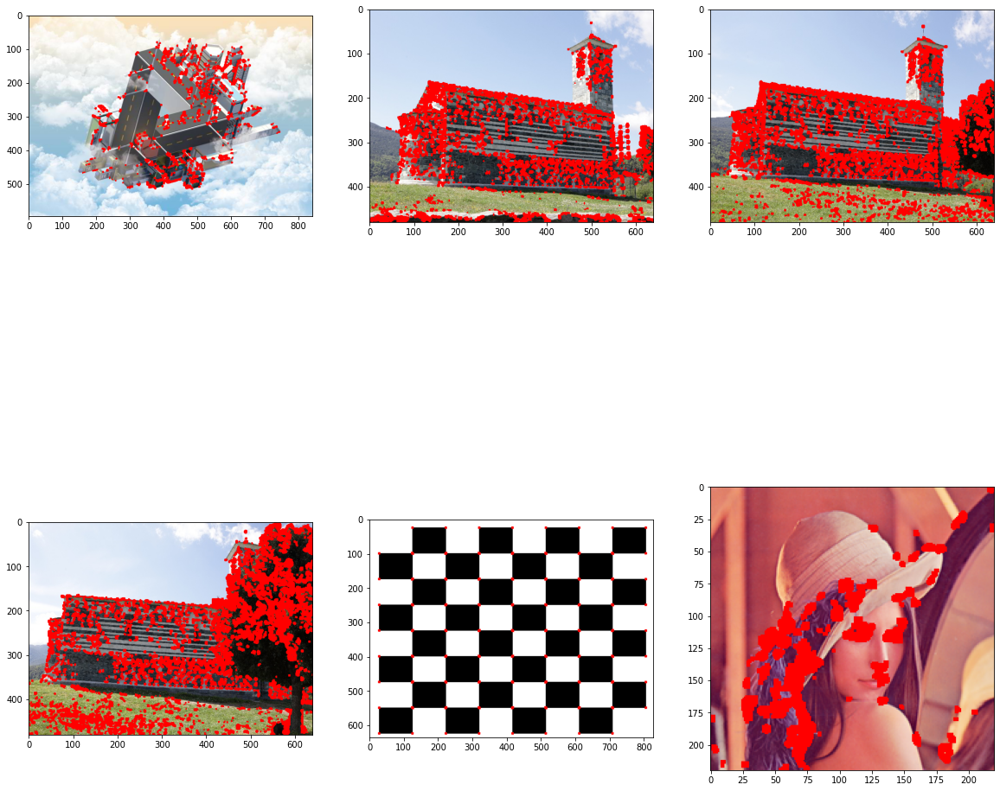

In [19]:
fig = plt.figure(figsize=(20, 20))
rows = 2
cols = 3

# block size : 5 , s_size : 3
harris_img_show_main(5,3)

### Fast Corner Detection 

연산이 빠른 corner detection 알고리즘이다 


**과제**
- FAST feature를 찾고, 이를 시각화한다.
- 파라미터를 바꿔가며 실험해본다.
- 제공한 이미지 외에 다른 이미지에도 적용하여 분석해 본다.

관련 함수

`	retval	=	cv.FastFeatureDetector_create(	[, threshold[, nonmaxSuppression[, type]]]	)`

### Fast Corner Detection (2006)
### ● 과정
#### 1. 어떤 점 p를 중심으로 하는 반지름 3인 원 상의 16개의 픽셀값을 보고 판단한다.
#### 2. 점 p 보다 기준값 이상 밝거나, 어두운 픽셀들이 n개 이상 연속적으로 존재하면 p를 Corner로 판단.

### ● 장점
#### 다른 특징점 추출 알고리즘들에 비해 속도에 최적화되어 설계되었다. 
#### 속도가 빠름에도 불구하고 특징점의 품질도 기존 방법들을 상회한다.
### ● 단점 
#### 점 p가 코너점으로 인식되면 점 p와 인접한 주변 점들도 같이 코너점으로 검출되는 경우가 많다는 단점이 존재. 이 문제를 해결하기 위해 non-maximal suppression 후처리가 필요하다.
#### 방향에 대한 계산이 들어있지 않기 때문에 Detection을 수행하기에 많은 어려움이 존재한다. 

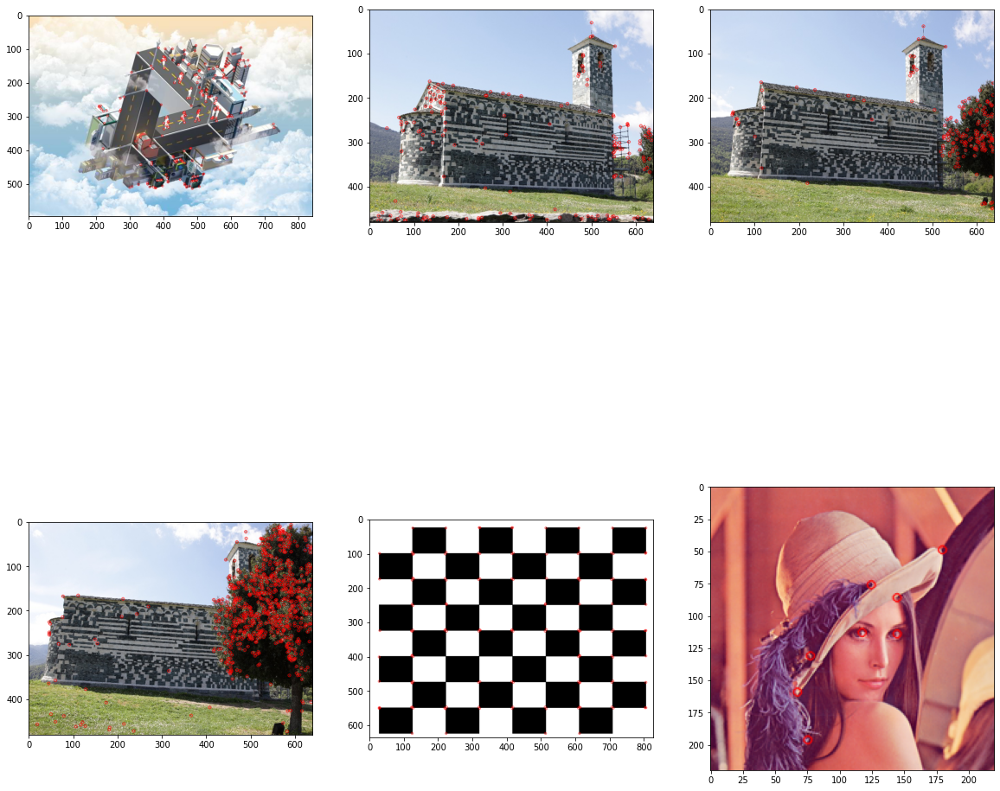

In [20]:
# Figure 생성
fig = plt.figure(figsize=(20, 20))
rows = 2
cols = 3

# Function : Fast_Corner_Detector - 빠른 연산이 가능한 Fast Corner Detection 수행
def Fast_Corner_Detector(img_name,idx,thr=100):
  global ROOT
  
  # source image 를 load 한다.
  src_img = cv.imread( ROOT + img_name)

  # source image 를 gray image 로 convert 한다.
  gray_img = cv.cvtColor(src_img, cv.COLOR_BGR2GRAY)

  # To-do
  sub_img1, sub_img2 = None, None

  # FAST 적용을 위해 cv2.FastFeatureDetector_create()를 이용한다. 
  # 인자 값은 Threshold 값으로 이 값이 커지면 검출하는 Keypoint 개수가 줄어든다.
  fast = cv.FastFeatureDetector_create(thr)

  # FAST 알고리즘으로 Keypoint를 검출한다.
  kp = fast.detect(src_img)

  sub_img1 = cv.drawKeypoints(src_img,kp,sub_img1,(0,0,255),2)

  # print("Threshold : {}".format(fast.getThreshold()))
  # print("nonmaxSuppression : {}".format(fast.getNonmaxSuppression()))
  # print("neighborhood : {}".format(fast.getType()))
  # print("Total Keypoints with nonmaxSuppression : {}".format(len(kp)))

  ax = fig.add_subplot(rows, cols, idx)
  plt.imshow(cv.cvtColor(sub_img1, cv.COLOR_BGR2RGB))

def Fast_img_show_main(thr=100):
  global ROOT
  global file_lists
  idx = 1

  for img_name in file_lists:
    Fast_Corner_Detector(img_name,idx,thr)
    idx += 1
  plt.show()

# threshold : 100
Fast_img_show_main()

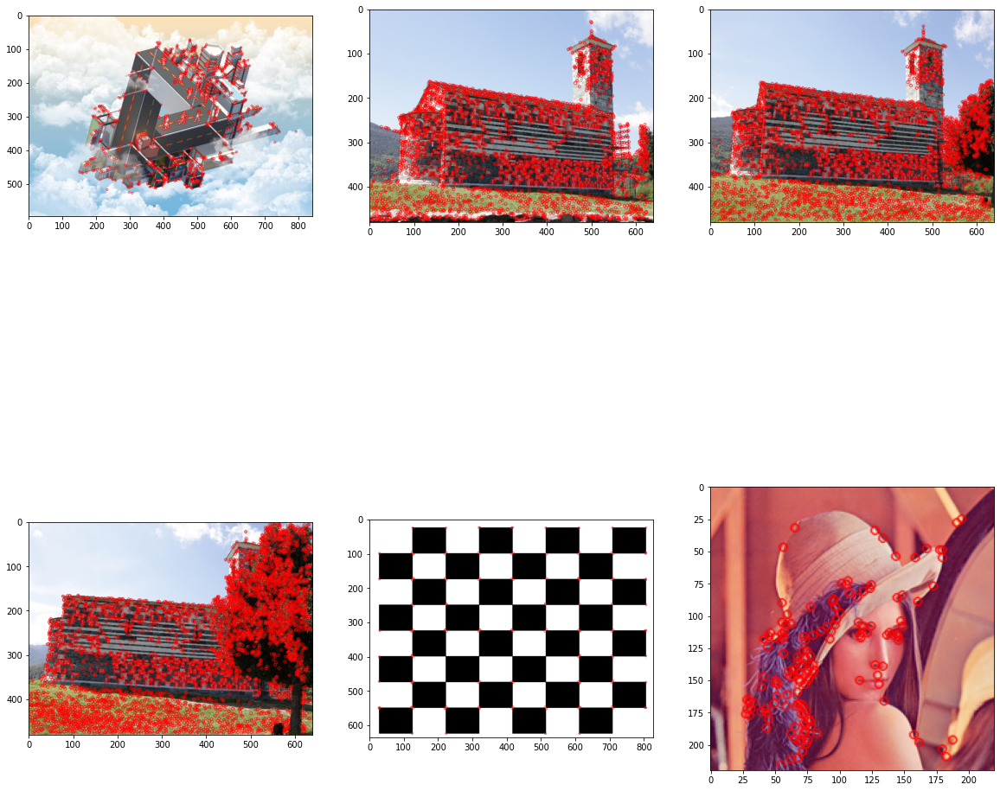

In [21]:
# Figure 생성
fig = plt.figure(figsize=(20, 20))
rows = 2
cols = 3

# threshold : 300
Fast_img_show_main(300)

### ORB(Oriented FAST and Rotated BRIEF) detector

FAST 와 BRIEF를 기반으로 만들어진 알고리즘이다. 논문에서는 SURF와 SIFT보다 매우 빠르고, SURF 보다 정확한, 낮은 컴퓨팅 파워 환경에서 돌리기에 좋은 알고리즘이라 소개 한다.

**과제**
-  ORB feature를 찾고, 이를 시각화한다.
- 파라미터를 바꿔가며 실험해본다.
- 제공한 이미지 외에 다른 이미지에도 적용하여 분석해 본다.

관련 함수

`	retval	=	cv.ORB_create(	[, nfeatures[, scaleFactor[, nlevels[, edgeThreshold[, firstLevel[, WTA_K[, scoreType[, patchSize[, fastThreshold]]]]]]]]]	)`


### Oriented FAST and Rotated BRIEF Detector
### ● 과정
#### 1. FAST 알고리즘을 이용하여 특징점을 추출한후
#### 2. Harris Corner Dectection에서 사용하는 Corner에 대한 정량적인 값을 기준으로 가장 코너성이 큰 N개의 코너를 선택한다.
#### 3. SIFT에서 사용되는 Scale Pyramid 를 이용하여 특징점을 추출하고 여러 스케일에 대한 특징점을 찾는다.
#### 4. Corner의 방향을 알아내기 위하여 한 윈도우 안에서 Intensity Centroid를 계산한다. 특징으로 추출된 픽셀을 중심으로 윈도우를 형성하고, 중심에 있는 코너로 부터 계한한 Intensity Centroid의 방향이 코너의 방향성을 대변한다.
#### 5. Descriptor의 경우 steer-BRIEF를 사용(BRIEF는 방향에 대한 정보를 가지지 않기 때문)

### ● 장점
#### SIFT, SUFR 보다 매우 빠르며, SURF 보다 정확하고, 낮은 컴퓨팅 파워 환경에서 실행되기 좋은 알고리즘이다.
### ● 단점 


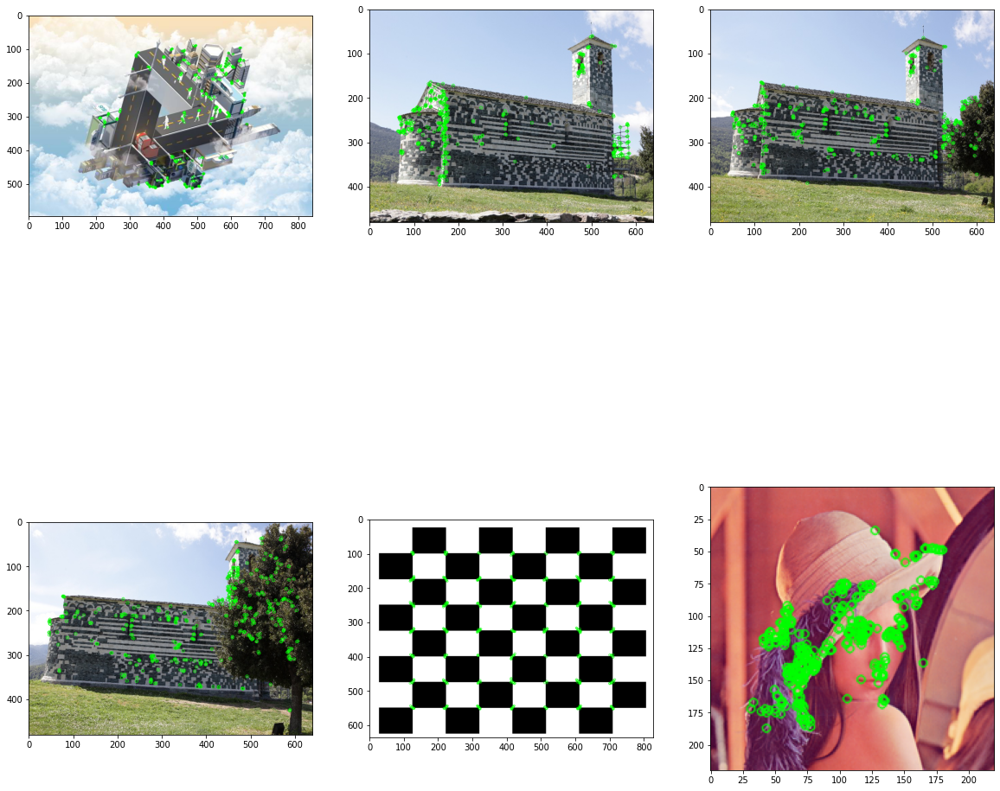

In [0]:
fig = plt.figure(figsize=(20, 20))
rows = 2
cols = 3

def ORB_Detector(img_name,idx):
  global ROOT

  # source image 를 load 한다.
  src_img = cv.imread( ROOT + img_name)
  
  # source image 를 gray image 로 convert 한다.
  gray_img = cv.cvtColor(src_img, cv.COLOR_BGR2GRAY)

  # To-do
  # Initiate ORB Detector
  orb = cv.ORB_create()

  # find the keypoints with ORB
  kp = orb.detect(src_img,None)

  # compute the descriptors with ORB
  kp, des = orb.compute(src_img, kp)

  # Draw only keypoints location, not size and orientation
  sub_img1 = cv.drawKeypoints(src_img,kp,None,color=(0,255,0), flags=0)

  ax = fig.add_subplot(rows, cols, idx)
  plt.imshow(cv.cvtColor(sub_img1,cv.COLOR_BGR2RGB))

def ORB_img_show_main():
  global ROOT
  global file_lists
  idx = 1 
  for img_name in file_lists:
    ORB_Detector(img_name,idx)
    idx+=1
  plt.show()

ORB_img_show_main()  

### SIFT feature detection

SIFT(Scale-Invariant Feature Transform)은 특징점의 크기와 각도까지 같이 계산하여 이미지의 크기가 변하거나 회전해도 동일한 특징점을 찾을 수 있도록 하는 방법이다. 또한 특징점 근처의 이미지 특성(히스토그램)도 같이 계산해서 특징점 이미지의 모양도 구별할 수 있도록 한다.

**과제**
- SIFT feature를 찾고, 이를 시각화한다.
- 파라미터를 바꿔가며 실험해본다.
- 제공한 이미지 외에 다른 이미지에도 적용하여 분석해 본다.

관련 함수

`retval	=	cv.SIFT_create(	[, nfeatures[, nOctaveLayers[, contrastThreshold[, edgeThreshold[, sigma]]]]]	)
`

### SIFT
### ● 과정
#### 1. 크기에 불변한 특징점을 추출하기 위해 Scale-Pyramid를 만든다.
#### 2. Scale-Pyramid 각각에서 특징점을 찾는다.
#### 3. 회전 불변 특성을 위해 특징점 주변의 그레디언트 방향과 크기를 수집한다. 특징점을 중심으로 윈도우를 설정하여 그 안의 픽셀에 대한 그레디언트의 크기와 방향을 구한다.
#### 4. 360도를 36등분하여 36개의 bin을 가진 그레디언트 벡터 히스토그램을 이용하여 가장 값이 큰 bin이 해당되는 특징점의 방향, 그 bin의 크기가 특징점의 크기가 된다.

### ● 장점
#### 이미지의 크기가 변하거나, 회전하는 경우 모두 특징점을 찾을수 있다. 특징점 근처의 이미지 특성도 같이 계산하기 때문에 특징점 이미지의 모양도 구별해낼 수 있다.
#### 여러사람의 성능 비교 결과에 따르면 반복성이 여러 지역 특징들 중에서 최고 수준
### ● 단점 
#### Scale-Pyramid 마다 연산을 해야하며, 회전 불변성을 위한 계산도 진행이 되기 때문에, 계산량이 많고 고성능 프로세싱이 필요하다.
#### 하나의 특징점에 대해 수많은 특징점들이 매칭될 수 있으며, feature 자체의 성능보다는 어떤 매칭 방법을 사용했으냐에 따라서 최종 성능이 크게 좌우된다.

3.4.2


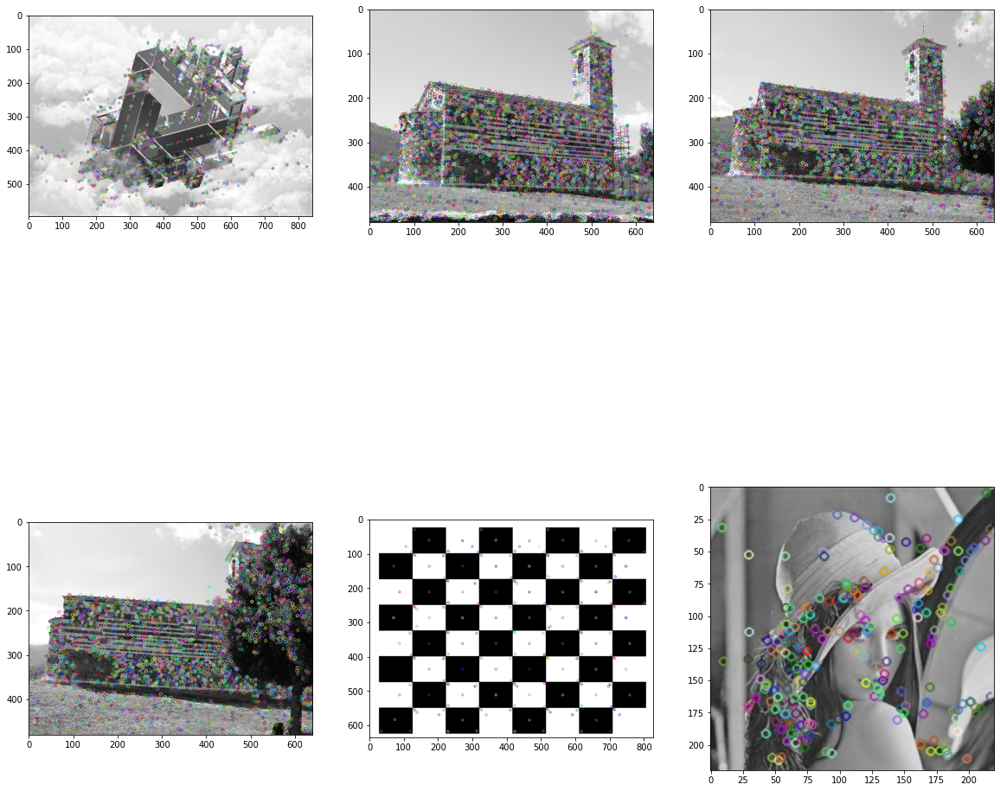

In [24]:
import cv2
import matplotlib.pyplot as plt

print(cv2.__version__)

fig = plt.figure(figsize=(20, 20))
rows = 2
cols = 3

# Function : SIFT_Detector
def SIFT_Detector(img_name,idx, flag = False):
  global ROOT
  # source image
  src_img = cv2.imread( ROOT + img_name)
  # gray image
  gray_img = cv2.cvtColor(src_img, cv2.COLOR_BGR2GRAY)

  # To-do
  # sift decriptor create
  sift = cv2.xfeatures2d.SIFT_create()

  # find keypoints
  kp = sift.detect(gray_img,None)

  sub_img = None
  # draw key points
  if not flag:
    sub_img = cv2.drawKeypoints(gray_img, kp, sub_img)
  else:
    sub_img = cv2.drawKeypoints(gray_img,kp,sub_img,flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

  ax = fig.add_subplot(rows, cols, idx)
  plt.imshow(cv2.cvtColor(sub_img, cv2.COLOR_BGR2RGB))

def SIFT_img_show_main(flag=False):
  global ROOT
  global file_lists
  idx = 1
  for img_name in file_lists:
    SIFT_Detector(img_name,idx,flag)
    idx+=1
  plt.show()

SIFT_img_show_main()  

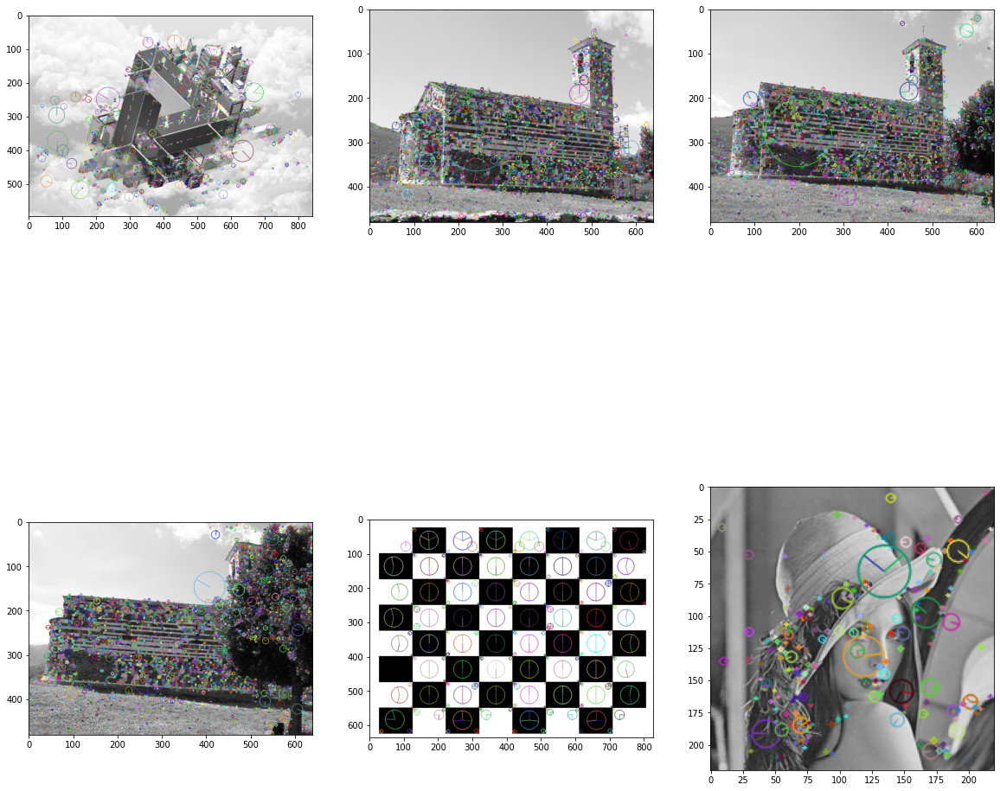

In [25]:
# create figure
fig = plt.figure(figsize=(20, 20))
rows = 2
cols = 3

SIFT_img_show_main(True) 


### SURF feature detection


SURF(Speeded-Up Robust Features)는 인텐서티 계산 방법을 간략화 하는 등의 방법으로 SIFT 방법의 속도와 안정성을 개선한 것이다. 

**과제**
- SURF feature를 찾고, 이를 시각화한다.
- 파라미터를 바꿔가며 실험해본다.
- 제공한 이미지 외에 다른 이미지에도 적용하여 분석해 본다.

관련 함수
- `retval	=	cv.xfeatures2d.SURF_create(	[, hessianThreshold[, nOctaves[, nOctaveLayers[, extended[, upright]]]]]	)
`


### SURF
### ● 과정
#### 1. Integral Image를 이용한다. 관심점 계산을 위해 Fast Hessian Detector를 사용한다.
#### 2. 축소한 Detector와 Descriptor를 사용하여 빠른 차원수 축소를 진행한다.
#### - Hessian Detector로 찾은 특징점에서 6s의 범위내 dx, dy 의 haar reponse룰 구한다.
#### - 60도 범위내 sliding window의 reponse value를 구하고 그 값이 최대인 방향을 주방향으로 설정한다.
#### - 특징점 위치에서 20s X 20s 크기 위도우를 4x4 서브윈도우로 구분하고 가로, 세로 방향의 haar wavelet response 벡터를 구한다.

### ● 장점
#### 이미지 블러나 회전, 크기에 대한 강한 특징이 있다.
#### SIFT 알고리즘보다 빠르고 강건한다.
### ● 단점 
#### VIEW POINT 변화나 조명 변화에 약한 특징이 있다.
#### Gray 공간상의 정보만 이용함에 따라 컬러 공간상에 주어진 많은 유용한 특징들을 활용하지 못함.

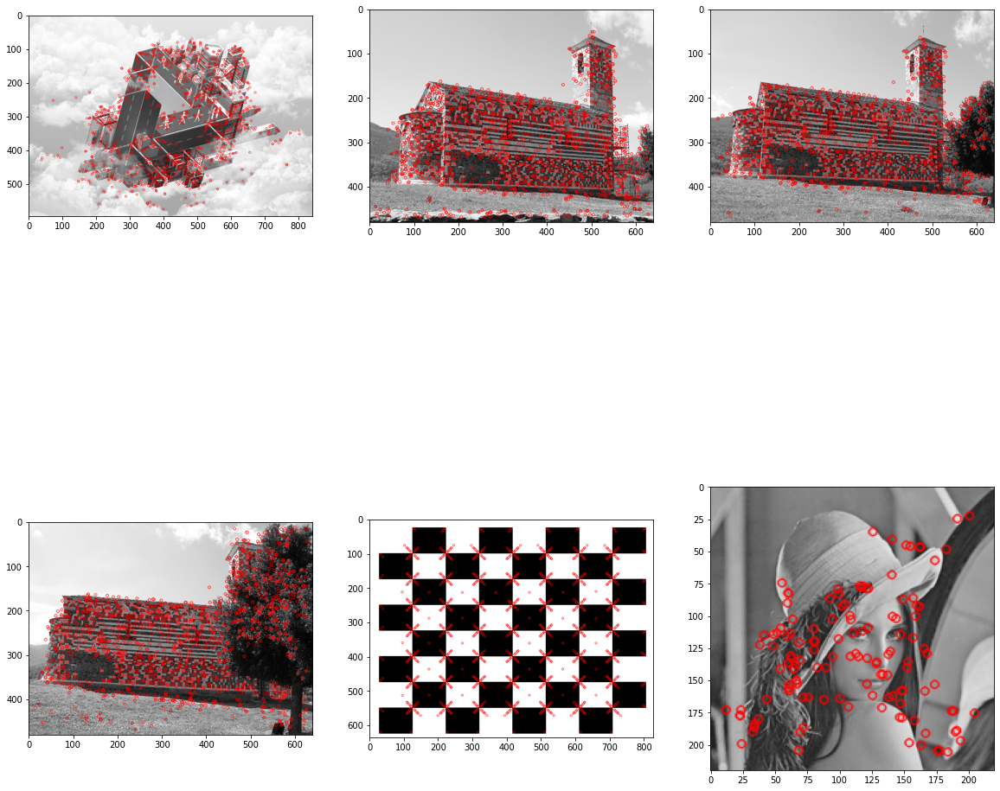

In [26]:
fig = plt.figure(figsize=(20, 20))
rows = 2
cols = 3

def SURF_Detector(img_name,idx,h_thr = 1000):
  global ROOT
  
  # load source image
  src_img = cv2.imread( ROOT + img_name)
  # gray scale image
  gray_img = cv2.cvtColor(src_img, cv2.COLOR_BGR2GRAY)

  sub_img = None

  # To-do
  # surf decriptor create
  surf = cv2.xfeatures2d.SURF_create()
  # set hessian threshold
  surf.setHessianThreshold(h_thr)

  # find key points
  kp, des = surf.detectAndCompute(gray_img,None)

  # draw key points in sub image
  sub_img = cv2.drawKeypoints(gray_img, kp, sub_img, (0,0,255))

  # print(len(kp))
  # print(surf.getHessianThreshold())
  ax = fig.add_subplot(rows, cols, idx)
  plt.imshow(cv2.cvtColor(sub_img, cv2.COLOR_BGR2RGB))

def SURF_img_show_main(h_thr = 1000):
  global ROOT
  global file_lists
  idx = 1
  for img_name in file_lists:
    SURF_Detector(img_name,idx, h_thr)
    idx+=1
  plt.show()

# hessian threshold = 1000
SURF_img_show_main()  


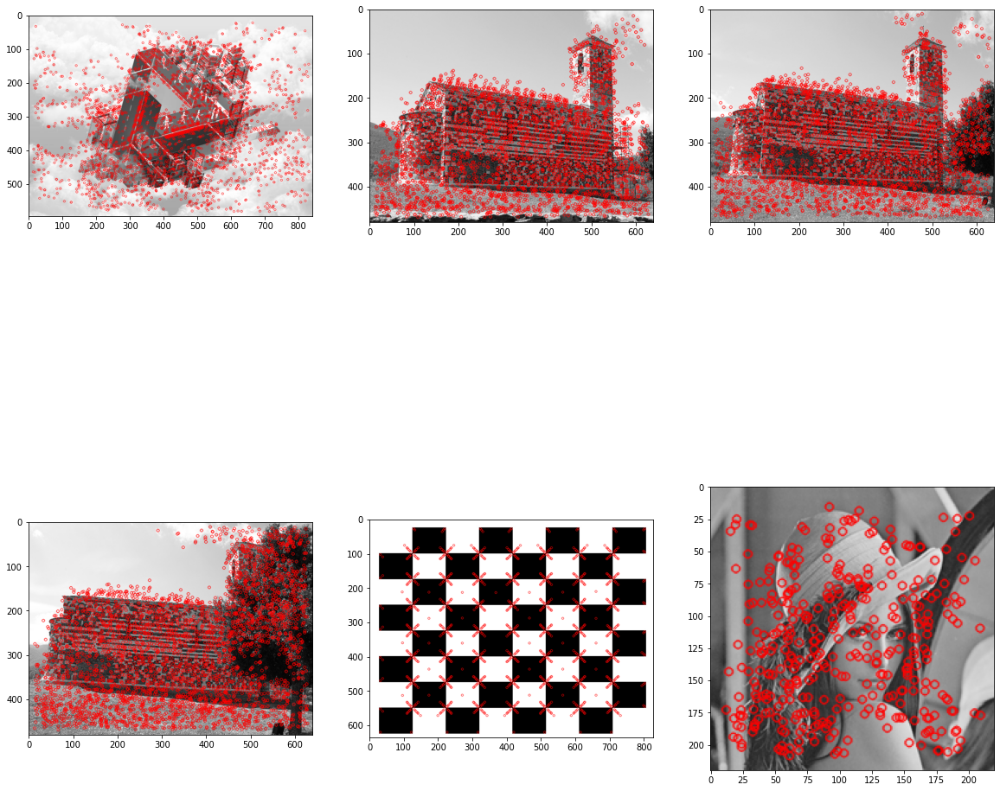

In [27]:
# create figure
fig = plt.figure(figsize=(20, 20))
rows = 2
cols = 3

# hessian threshold = 100
SURF_img_show_main(100) 

### 추가 점수 과제

- 지금까지 사용해본 feature detection 알고리즘들을 조사해 보고, 각 알고리즘간의 차이와 장단점을 서술하시오.

--> 각 알고리즘마다 서술완료